In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
import gseapy

sc.settings.autosave = False
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [2]:
All_no_mt = sc.read_h5ad("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/All_together_nonlognorm.h5ad")

In [3]:
All_no_mt_2_UMI_5_percent = All_no_mt[:, ((All_no_mt.X > 2).sum(axis=0) / All_no_mt.shape[0] ) > 0.05]

II_UMI_V_percent_genes = All_no_mt_2_UMI_5_percent.var.index

len(II_UMI_V_percent_genes)

3303

In [4]:
All_no_mt_2_UMI_2_percent = All_no_mt[:, ((All_no_mt.X > 2).sum(axis=0) / All_no_mt.shape[0] ) > 0.02]

II_UMI_II_percent_genes = All_no_mt_2_UMI_2_percent.var.index

len(II_UMI_II_percent_genes)

4913

In [5]:
All_no_mt_1_UMI_2_percent = All_no_mt[:, ((All_no_mt.X > 1).sum(axis=0) / All_no_mt.shape[0] ) > 0.02]

I_UMI_II_percent_genes = All_no_mt_1_UMI_2_percent.var.index

len(I_UMI_II_percent_genes)

7793

In [6]:
# Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(All_no_mt, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(All_no_mt)

normalizing counts per cell
    finished (0:00:00)


In [7]:
sc.pp.highly_variable_genes(All_no_mt, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [8]:
Combined = sc.read_h5ad("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/All_together_no_regress_MNN_lognorm.h5ad")

df = pd.read_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/All_together_all_hvgo_MNN_cell_types.csv", index_col=0)
labels = df['labels']
labels

Combined.obs['cell_type'] = labels

In [9]:
Combined

AnnData object with n_obs × n_vars = 76110 × 22487
    obs: 'Sample', 'Time', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'cell_type'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions_norm', 'dispersions-0', 'dispersions-1', 'dispersions-2', 'dispersions-3'

In [10]:
Combined_MEP = Combined[Combined.obs.cell_type == 'MEP']

Combined_MEP

View of AnnData object with n_obs × n_vars = 8165 × 22487
    obs: 'Sample', 'Time', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'cell_type'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions_norm', 'dispersions-0', 'dispersions-1', 'dispersions-2', 'dispersions-3'

In [11]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(Combined_MEP, max_value=10)

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [12]:
# Principal component analysis

# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(Combined_MEP, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


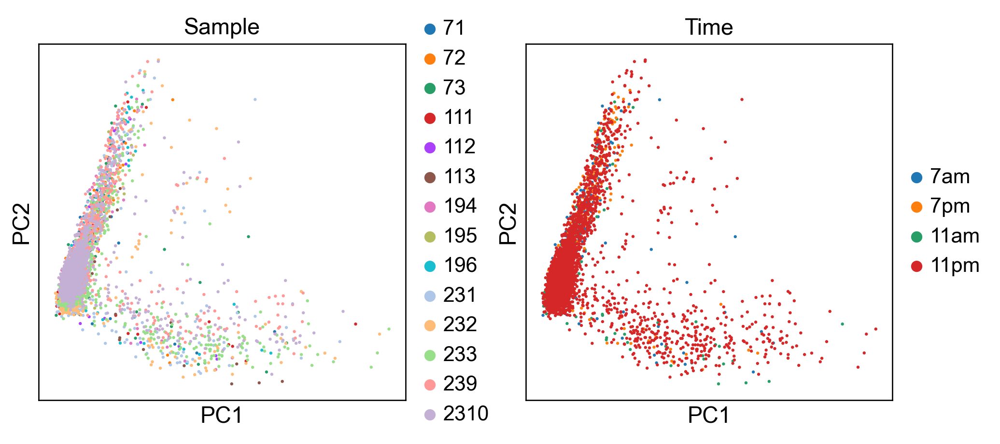

In [13]:
# We can make a scatter plot in the PCA coordinates, but we will not use that later on.
sc.pl.pca(Combined_MEP, color=['Sample', 'Time'])

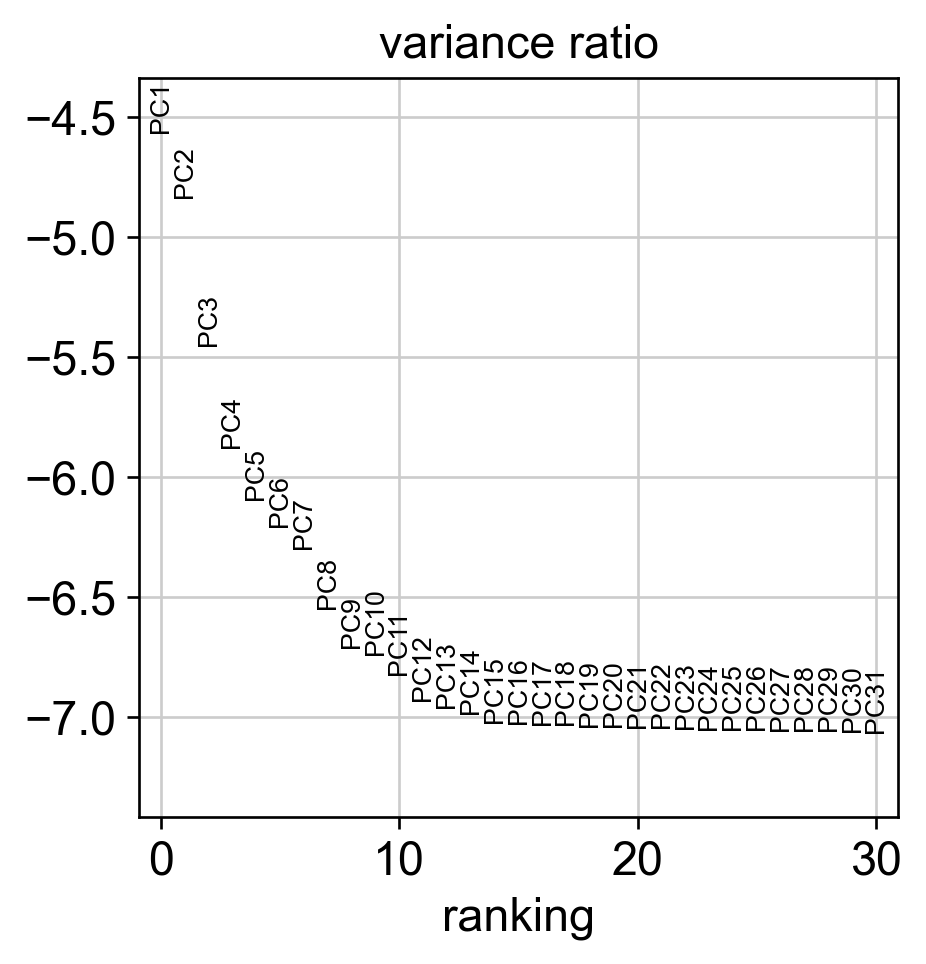

In [14]:
# Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.
sc.pl.pca_variance_ratio(Combined_MEP, log=True)

In [15]:
sc.tl.tsne(Combined_MEP, n_pcs = 50)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:15)


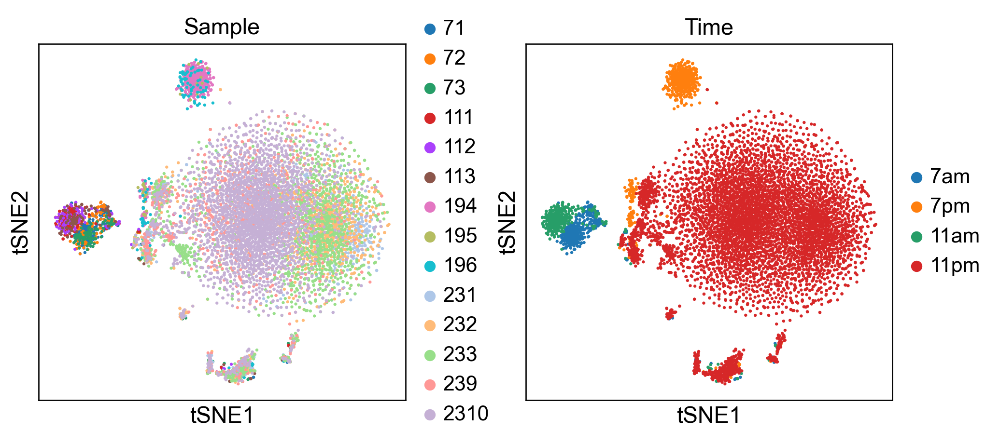

In [16]:
sc.settings.autosave = True
sc.settings.figdir = "/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/"

sc.pl.tsne(Combined_MEP, color=['Sample', 'Time'])

In [17]:
# Computing the neighborhood graph

#Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.
sc.pp.neighbors(Combined_MEP, n_neighbors=20, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [18]:
# Embedding the neighborhood graph

# We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

# tl.paga(adata)
# pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# tl.umap(adata, init_pos='paga')

sc.tl.umap(Combined_MEP)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


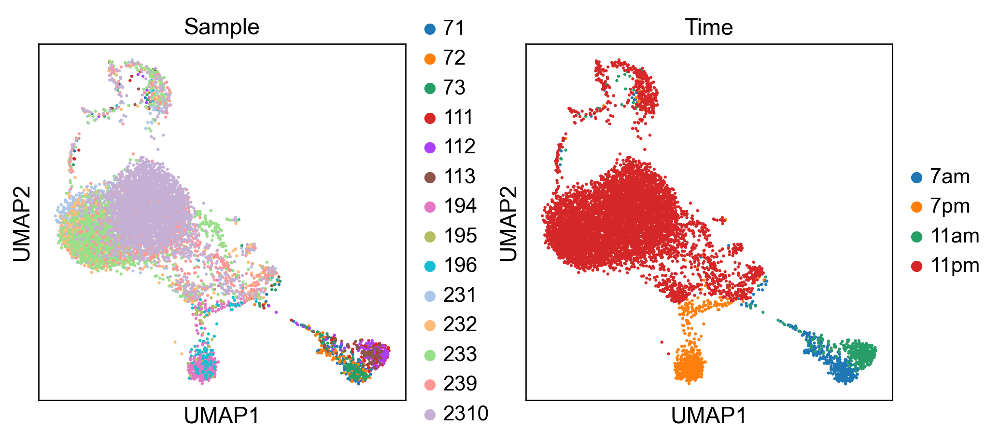

In [19]:
sc.pl.umap(Combined_MEP, color=['Sample', 'Time'])

In [20]:
sc.settings.autosave = False

In [21]:
Combined_MEP.write('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEPs_together_time_MNN.h5ad')

In [22]:
Combined_MEP = sc.read_h5ad('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEPs_together_time_MNN.h5ad')

In [23]:
import csv

row1 = ['Combined MEP cell number:', Combined_MEP.shape[0]]
row2 = ['Combined MEP gene number:', Combined_MEP.shape[1]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEPs_together_time_MNN.csv', 'w') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)
    write.writerow(row2)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Time']`


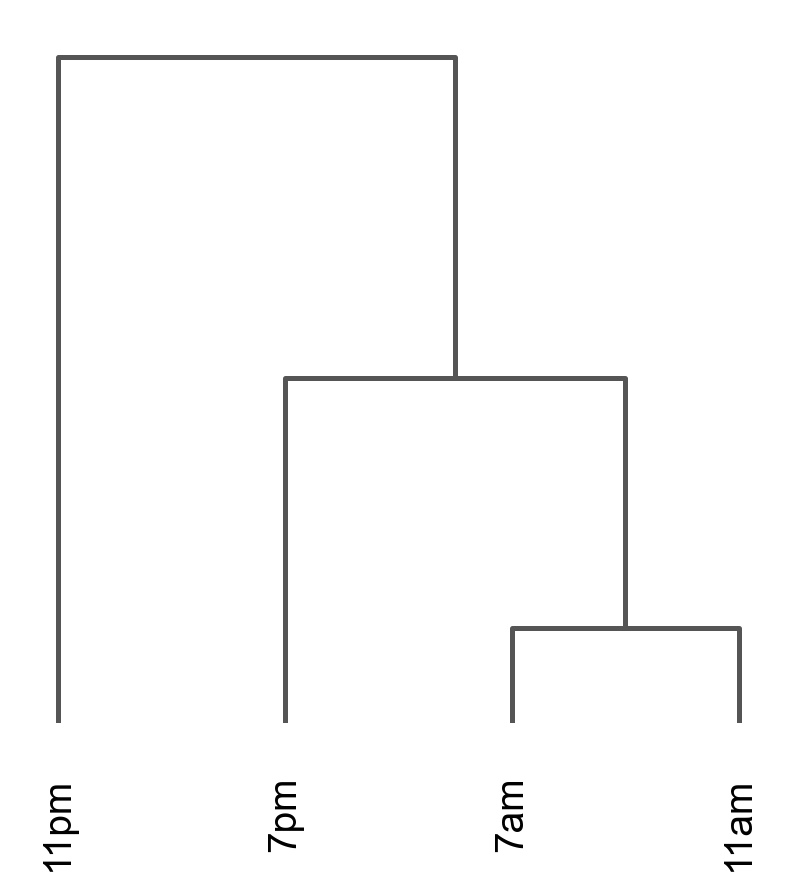

In [24]:
sc.tl.dendrogram(Combined_MEP, groupby='Time')
ax = sc.pl.dendrogram(Combined_MEP, 'Time')

In [25]:
Combined_MEP_gene_list = Combined_MEP.var_names.str.strip().tolist()
textfile = open("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEPs_together_time_MNN_gene_list.txt", "w")
for element in Combined_MEP_gene_list:
    textfile.write(element + "\n")
textfile.close()

In [26]:
known_circadian_genes = ['Clock', 'Cry1', 'Cry2', 'Per1', 'Per2', 'Per3', 'Ifngr1', 'Ifngr2', 'Adrb2', 'Cxcr4', 'S1pr1', 'S1pr2', 'S1pr4', 'Ezh2', 'Tnfrsf1b', 'Tnfrsf18', 'Tnfrsf1a', 'Tnfrsf26', 'Tnfrsf22', 'Tnfrsf13b', 'Tnfrsf10b', 'Tnfrsf13c', 'Tnfrsf12a', 'Tnfrsf21']

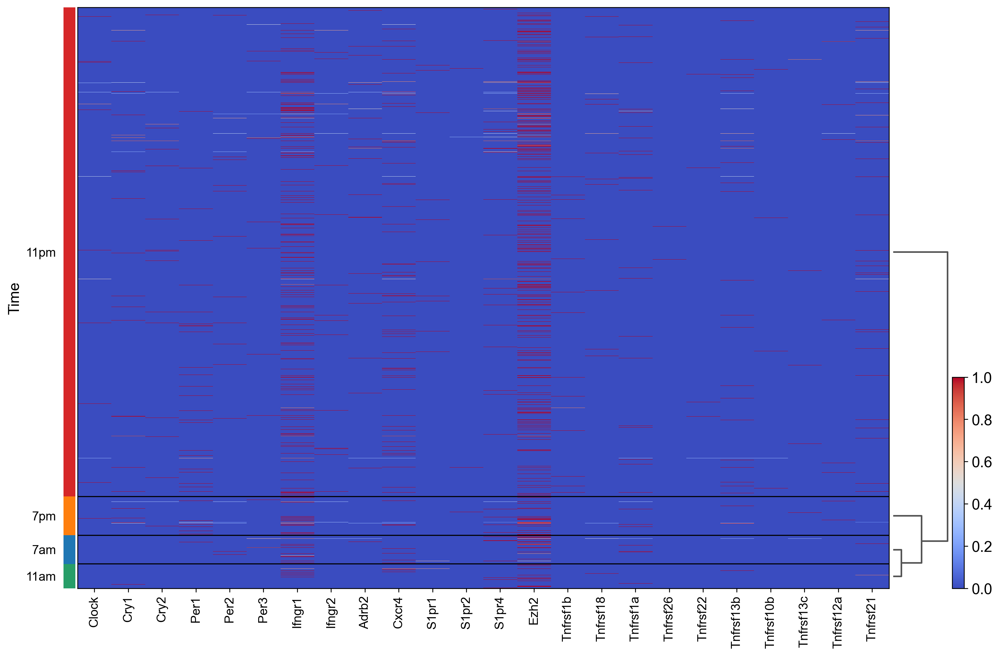

In [27]:
sc.pl.heatmap(Combined_MEP, known_circadian_genes, groupby='Time', cmap='coolwarm', dendrogram=True, figsize=(15,10), vmin=0, vmax=1)

In [28]:
sc.settings.autosave = True
sc.settings.figdir = "/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/"

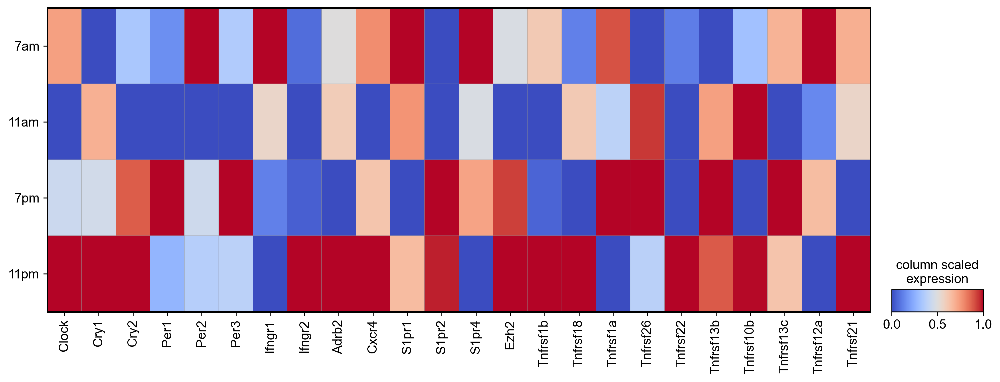

In [29]:
sc.pl.matrixplot(Combined_MEP, known_circadian_genes, groupby='Time', categories_order=['7am', '11am', '7pm', '11pm'], cmap='coolwarm', standard_scale='var', figsize=(15,5), use_raw=True, colorbar_title='column scaled\nexpression', save='Known circadian genes MEPs.png')

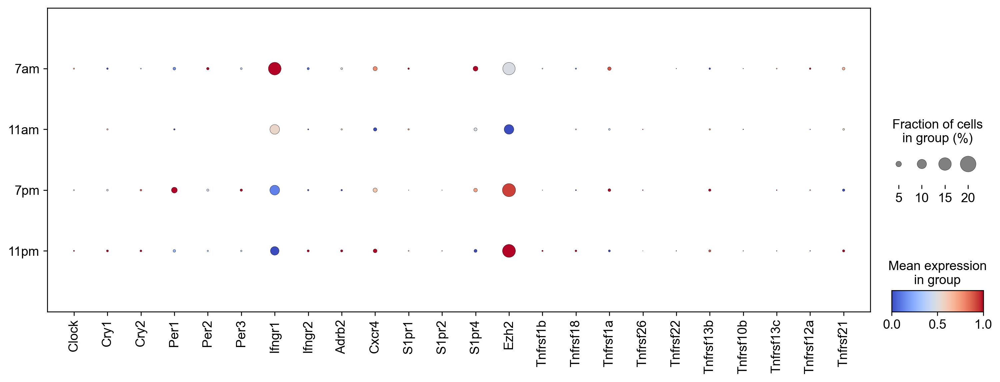

In [30]:
sc.pl.dotplot(Combined_MEP, known_circadian_genes, groupby='Time', categories_order=['7am', '11am', '7pm', '11pm'], cmap='coolwarm', standard_scale='var', figsize=(15,5), use_raw=True, save='Known circadian genes MEPs.png',)

In [31]:
sc.settings.autosave = False

In [32]:
Combined_MEP_I_UMI_II_percent = Combined_MEP[:, I_UMI_II_percent_genes]

Combined_MEP_I_UMI_II_percent.raw = Combined_MEP.raw.to_adata()[:, I_UMI_II_percent_genes]

Combined_MEP_I_UMI_II_percent = Combined_MEP

In [33]:
import csv

row2 = ['Combined MEP 1 UMI 2 percent gene number:', Combined_MEP_I_UMI_II_percent.shape[1]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEPs_together_time_MNN.csv', 'w') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)
    write.writerow(row2)

In [34]:
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, groupby='Time', method='wilcoxon', key_added='wilcoxon_time', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7am', '11am', '7pm', '11pm'], key='wilcoxon_time').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_one_vs_all_DEGs_together_time_MNN.csv")

sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7am'], reference = '11am', method='wilcoxon', key_added='7am_vs_11am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7am'], key='7am_vs_11am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7am_vs_11am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7am'], reference = '7pm', method='wilcoxon', key_added='7am_vs_7pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7am'], key='7am_vs_7pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7am_vs_7pm_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7am'], reference = '11pm', method='wilcoxon', key_added='7am_vs_11pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7am'], key='7am_vs_11pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7am_vs_11pm_DEGs_together_time_MNN.csv")

sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11am'], reference = '7am', method='wilcoxon', key_added='11am_vs_7am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11am'], key='11am_vs_7am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11am_vs_7am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11am'], reference = '7pm', method='wilcoxon', key_added='11am_vs_7pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11am'], key='11am_vs_7pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11am_vs_7pm_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11am'], reference = '11pm', method='wilcoxon', key_added='11am_vs_11pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11am'], key='11am_vs_11pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11am_vs_11pm_DEGs_together_time_MNN.csv")

sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7pm'], reference = '7am', method='wilcoxon', key_added='7pm_vs_7am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7pm'], key='7pm_vs_7am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7pm_vs_7am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7pm'], reference = '11am', method='wilcoxon', key_added='7pm_vs_11am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7pm'], key='7pm_vs_11am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7pm_vs_11am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['7pm'], reference = '11pm', method='wilcoxon', key_added='7pm_vs_11pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['7pm'], key='7pm_vs_11pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_7pm_vs_11pm_DEGs_together_time_MNN.csv")

sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11pm'], reference = '7am', method='wilcoxon', key_added='11pm_vs_7am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11pm'], key='11pm_vs_7am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11pm_vs_7am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11pm'], reference = '11am', method='wilcoxon', key_added='11pm_vs_11am', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11pm'], key='11pm_vs_11am').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11pm_vs_11am_DEGs_together_time_MNN.csv")
sc.tl.rank_genes_groups(Combined_MEP_I_UMI_II_percent, 'Time', groups = ['11pm'], reference = '7pm', method='wilcoxon', key_added='11pm_vs_7pm', use_raw=True)
sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=['11pm'], key='11pm_vs_7pm').to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_11pm_vs_7pm_DEGs_together_time_MNN.csv")

ranking genes
    finished: added to `.uns['wilcoxon_time']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)
ranking genes
    finished: added to `.uns['7am_vs_11am']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['7am_vs_7pm']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group i

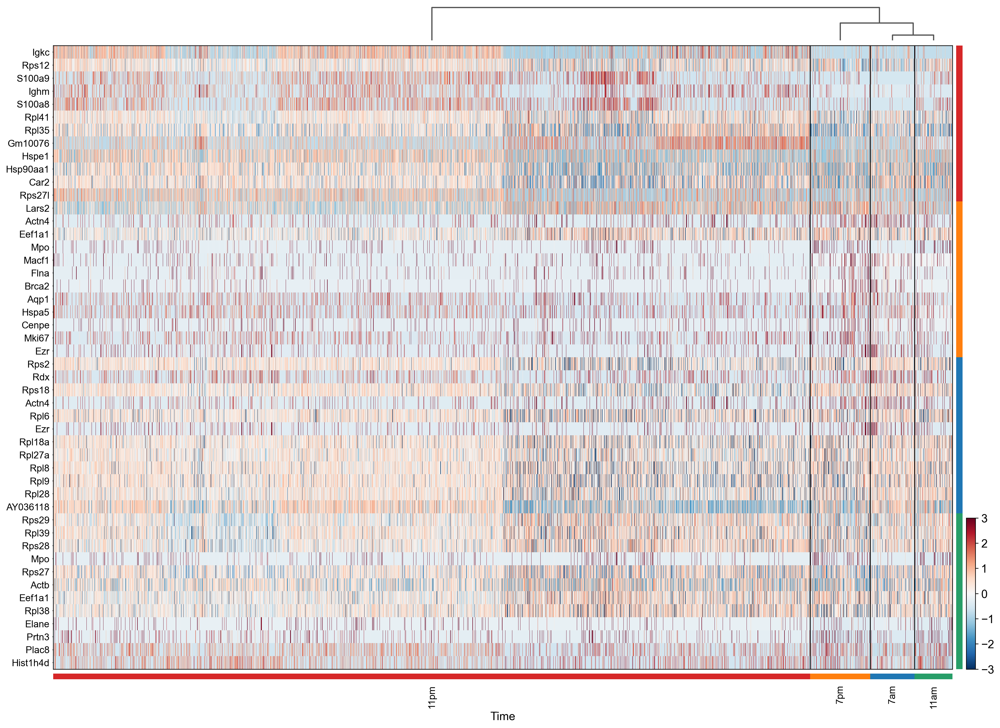

In [35]:
sc.pl.rank_genes_groups_heatmap(Combined_MEP_I_UMI_II_percent, groupby='Time', key='wilcoxon_time', vmin=-3, vmax=3, n_genes=12, figsize=(20,15), cmap='RdBu_r', use_raw=False, swap_axes=True)

In [36]:
Combined_MEP_I_UMI_II_percent.write('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_together_time_MNN_with_DGEs.h5ad')

In [37]:
Combined_MEP_I_UMI_II_percent = sc.read_h5ad('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percents_together_time_MNN_with_DGEs.h5ad')

In [38]:
volcano_7am_vs_11pm_MEP = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=None, key='7am_vs_11pm')

In [39]:
volcano_filtered_7am_vs_11pm_MEP = volcano_7am_vs_11pm_MEP[volcano_7am_vs_11pm_MEP['pvals_adj'] < 0.05]
#volcano_filtered_7am_vs_11pm_MEP = volcano_7am_vs_11pm_MEP[(volcano_7am_vs_11pm_MEP['logfoldchanges'] < -1.5) | (volcano_7am_vs_11pm_MEP['logfoldchanges'] > 1.5)]
volcano_filtered_7am_vs_11pm_MEP.shape

(27, 5)

In [40]:
row1 = ['7am vs 11pm MEP DEGs (p < 0.05):', volcano_filtered_7am_vs_11pm_MEP.shape[0]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEPs_together_time_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [41]:
volcano_filtered_7am_vs_11pm_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_7am_vs_11pm_MEP['pvals_adj'])
volcano_filtered_7am_vs_11pm_MEP.reset_index(inplace=True, drop=True)
volcano_filtered_7am_vs_11pm_MEP.shape

/tmp/ipykernel_314409/4105713679.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_filtered_7am_vs_11pm_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_7am_vs_11pm_MEP['pvals_adj'])


(27, 6)

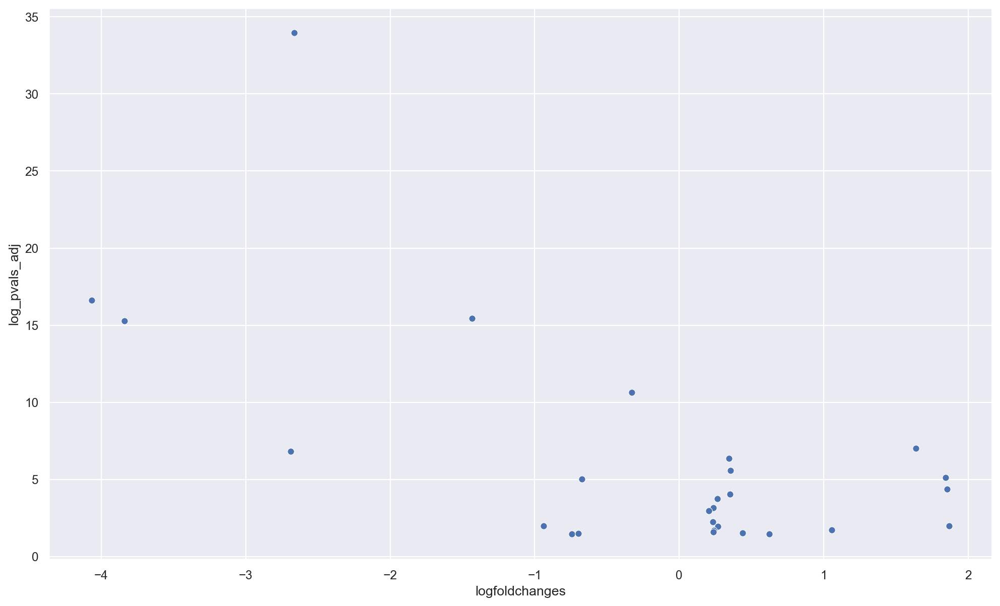

In [42]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_filtered_7am_vs_11pm_MEP, x='logfoldchanges', y= 'log_pvals_adj')
#for line in range(0,volcano_filtered_7am_vs_11pm_MEP.shape[0]):
     #plt.text(volcano_filtered_7am_vs_11pm_MEP.logfoldchanges[line], volcano_filtered_7am_vs_11pm_MEP.log_pvals_adj[line], volcano_filtered_7am_vs_11pm_MEP.names[line])
plt.savefig('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs DGEs.png')
plt.show()

In [43]:
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [44]:
glist_7am = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='7am', key='7am_vs_11pm', pval_cutoff=0.05, log2fc_min=0)['names'].squeeze().str.strip().tolist()
len(glist_7am)

17

In [45]:
row1 = ['7am vs 11pm MEPs upregulated DEGs (p < 0.05):', len(glist_7am)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [46]:
enr_res_7am_process = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_process.res2d[enr_res_7am_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_upregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(139, 10)

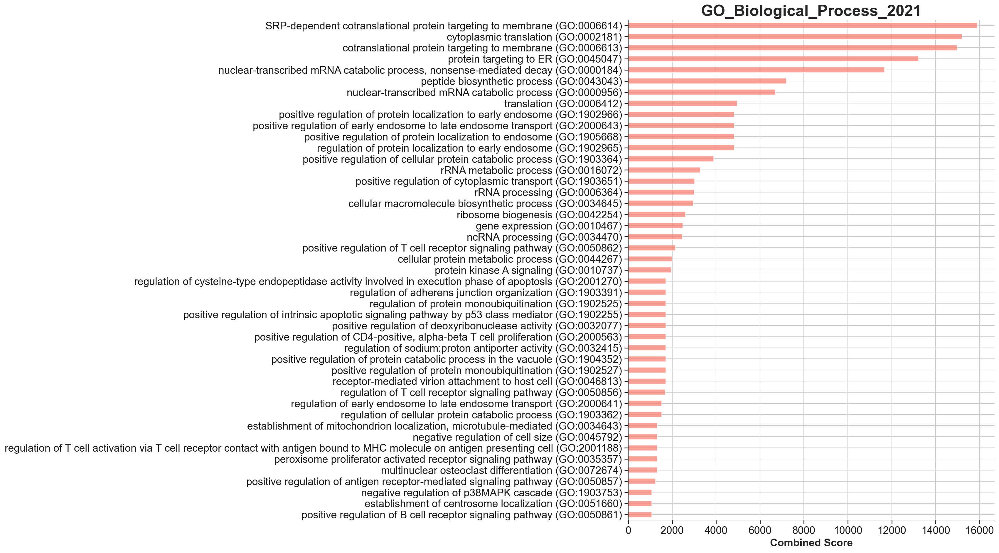

In [47]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs upregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [48]:
enr_res_7am_KEGG = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_KEGG.res2d[enr_res_7am_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_upregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(5, 10)

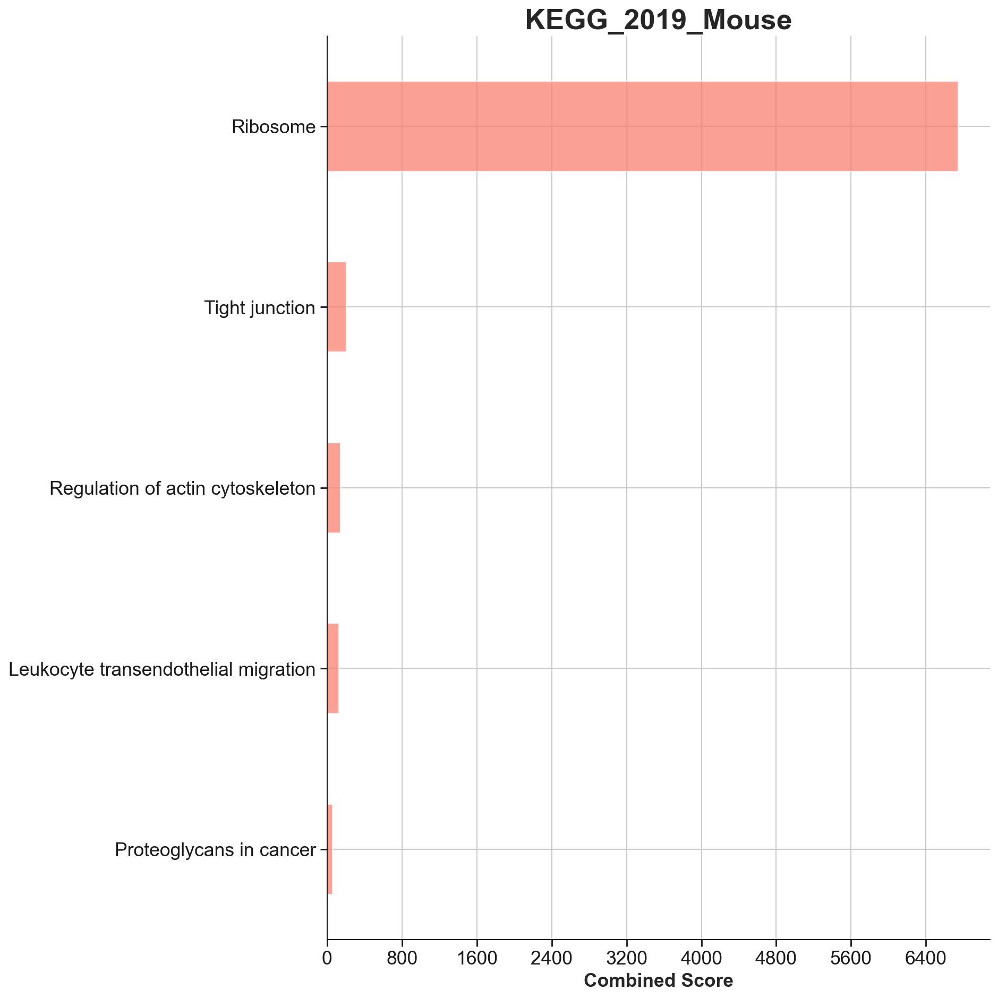

In [49]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs upregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [50]:
enr_res_7am_WIKI = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_WIKI.res2d[enr_res_7am_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_upregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(3, 10)

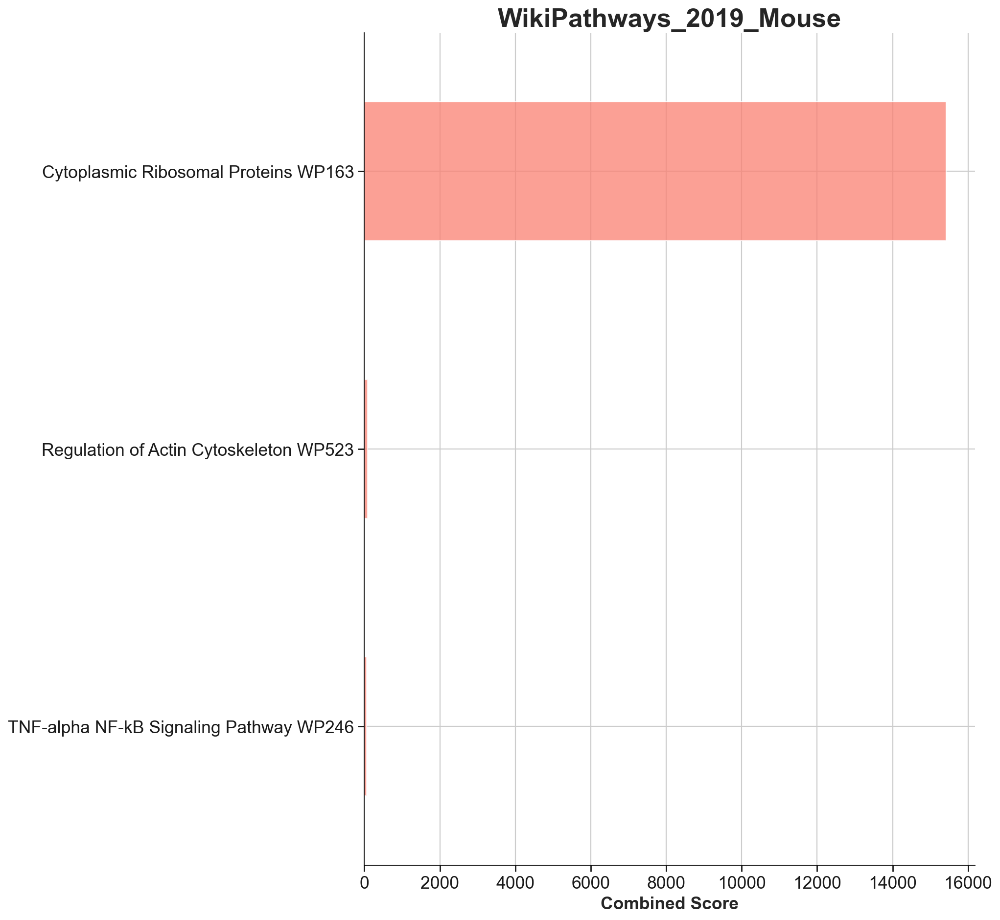

In [51]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs upregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [52]:
glist_7am = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='7am', key='7am_vs_11pm', pval_cutoff=0.05, log2fc_max=0)['names'].squeeze().str.strip().tolist()
len(glist_7am)

10

In [53]:
row1 = ['7am vs 11pm MEPs downregulated DEGs (p < 0.05):', len(glist_7am)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [54]:
enr_res_7am_process = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_process.res2d[enr_res_7am_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_downregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(90, 10)

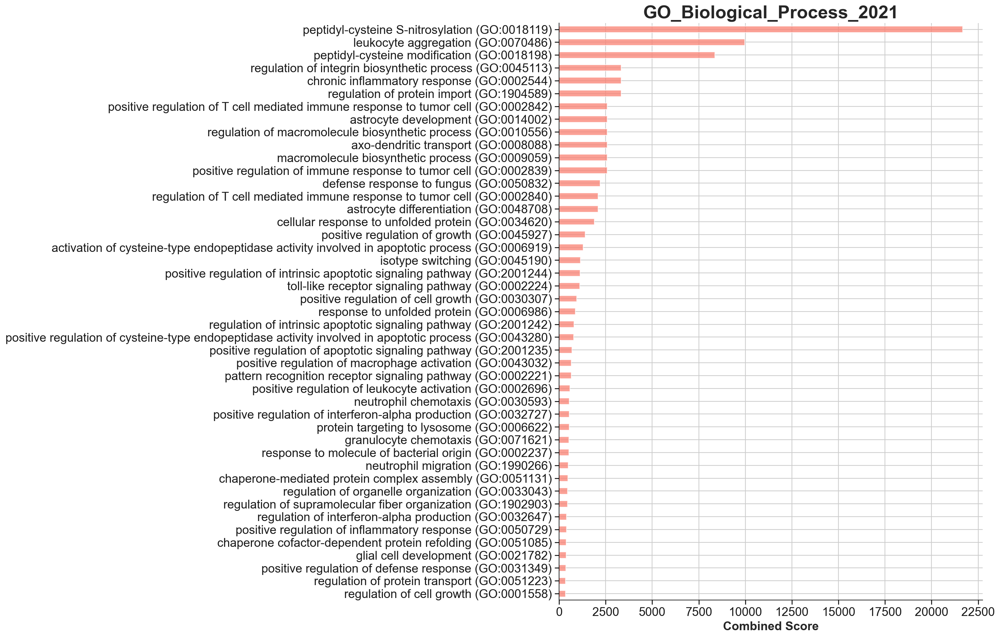

In [55]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs downregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [56]:
enr_res_7am_KEGG = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_KEGG.res2d[enr_res_7am_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_downregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(2, 10)

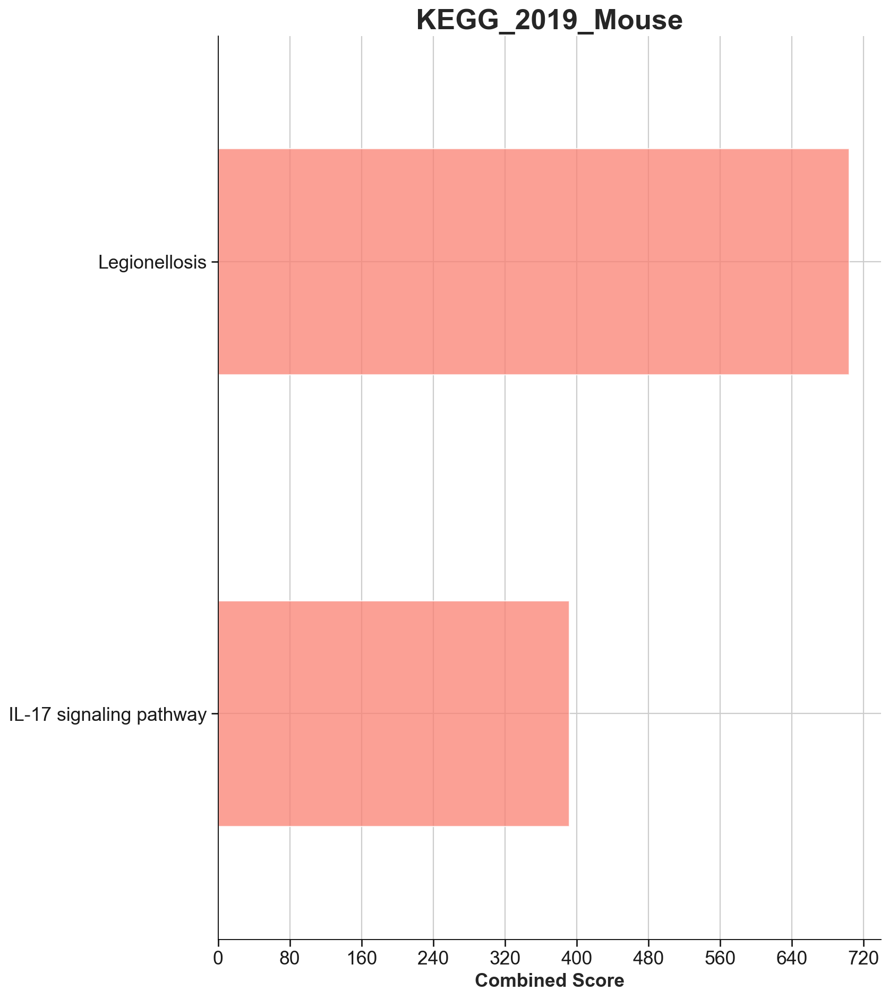

In [57]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs downregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [58]:
enr_res_7am_WIKI = gseapy.enrichr(gene_list=glist_7am, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7am_WIKI.res2d[enr_res_7am_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7am_vs_11pm_downregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(1, 10)

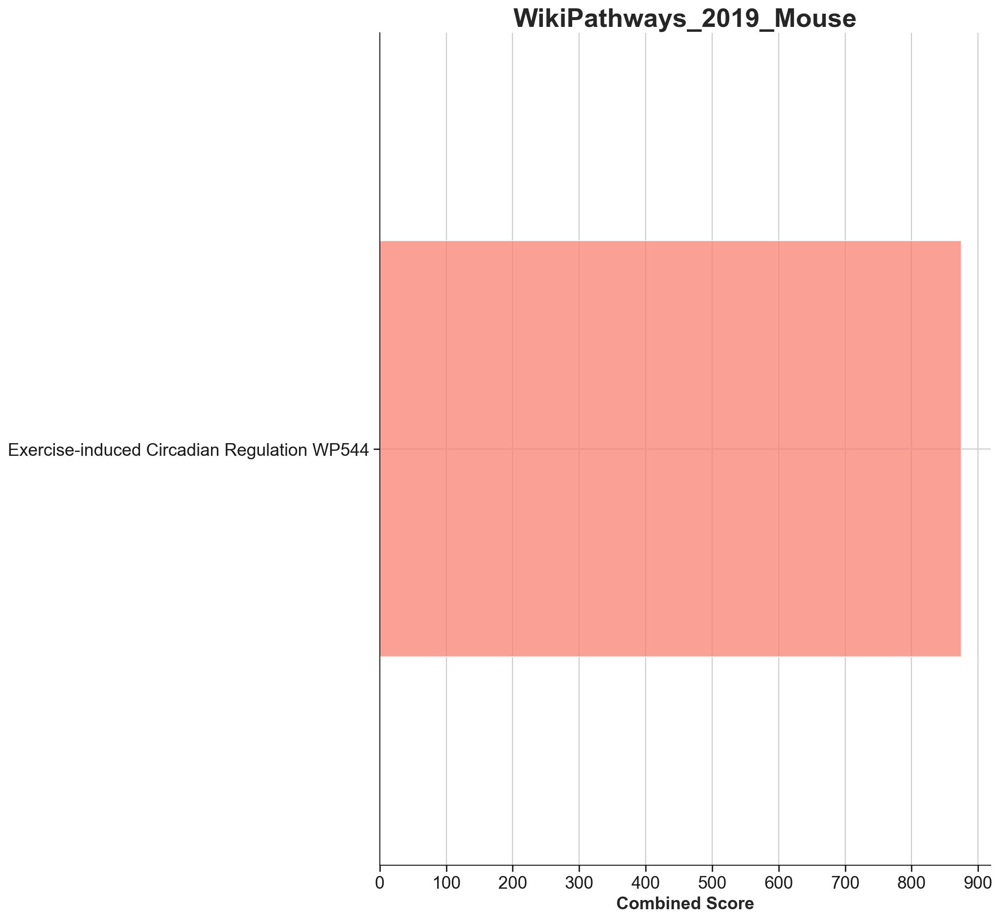

In [59]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7am vs 11pm MEPs downregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [60]:
volcano_11am_vs_7am_MEP = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=None, key='11am_vs_7am')

In [61]:
volcano_filtered_11am_vs_7am_MEP = volcano_11am_vs_7am_MEP[volcano_11am_vs_7am_MEP['pvals_adj'] < 0.05]
volcano_filtered_11am_vs_7am_MEP.shape

(7, 5)

In [62]:
row1 = ['11am vs 7am MEPs DEGs (p < 0.05):', volcano_filtered_11am_vs_7am_MEP.shape[0]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [63]:
volcano_filtered_11am_vs_7am_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_11am_vs_7am_MEP['pvals_adj'])
volcano_filtered_11am_vs_7am_MEP.reset_index(inplace=True, drop=True)
volcano_filtered_11am_vs_7am_MEP.shape

/tmp/ipykernel_314409/3569566607.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_filtered_11am_vs_7am_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_11am_vs_7am_MEP['pvals_adj'])


(7, 6)

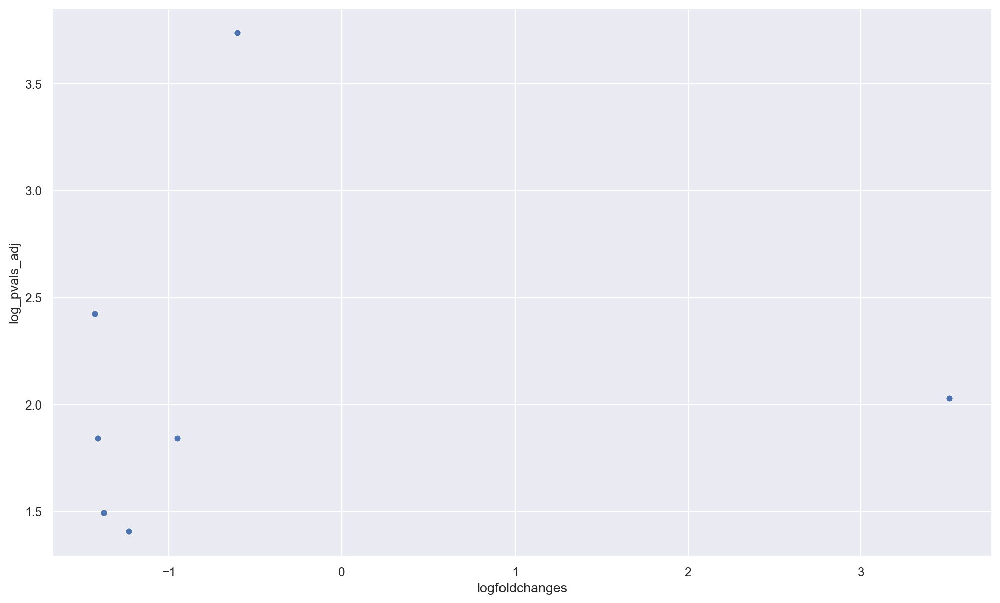

In [64]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_filtered_11am_vs_7am_MEP, x='logfoldchanges', y= 'log_pvals_adj')
#for line in range(0,volcano_filtered_11am_vs_7am_MEP.shape[0]):
     #plt.text(volcano_filtered_11am_vs_7am_MEP.logfoldchanges[line], volcano_filtered_11am_vs_7am_MEP.log_pvals_adj[line], volcano_filtered_11am_vs_7am_MEP.names[line])
plt.savefig('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs DGEs.png')
plt.show()

In [67]:
glist_11am = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='11am', key='11am_vs_7am', pval_cutoff=0.05, log2fc_min=0)['names'].squeeze().str.strip().to_list()
len(glist_11am)

6

In [69]:
row1 = ['11am vs 7am MEPs upregulated DEGs (p < 0.05):', len(glist_11am)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [70]:
enr_res_11am_process = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_process.res2d[enr_res_11am_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_upregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

FileNotFoundError: [Errno 2] No such file or directory: 'S100a8'

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs upregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [ ]:
enr_res_11am_KEGG = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_KEGG.res2d[enr_res_11am_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_upregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs upregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [ ]:
enr_res_11am_WIKI = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_WIKI.res2d[enr_res_11am_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_upregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs upregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [71]:
glist_11am = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='11am', key='11am_vs_7am', pval_cutoff=0.05, log2fc_max=0)['names'].squeeze().str.strip().tolist()
len(glist_11am)

6

In [72]:
row1 = ['11am vs 7am MEPs downregulated DEGs (p < 0.05):', len(glist_11am)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [73]:
enr_res_11am_process = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_process.res2d[enr_res_11am_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_downregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(60, 10)

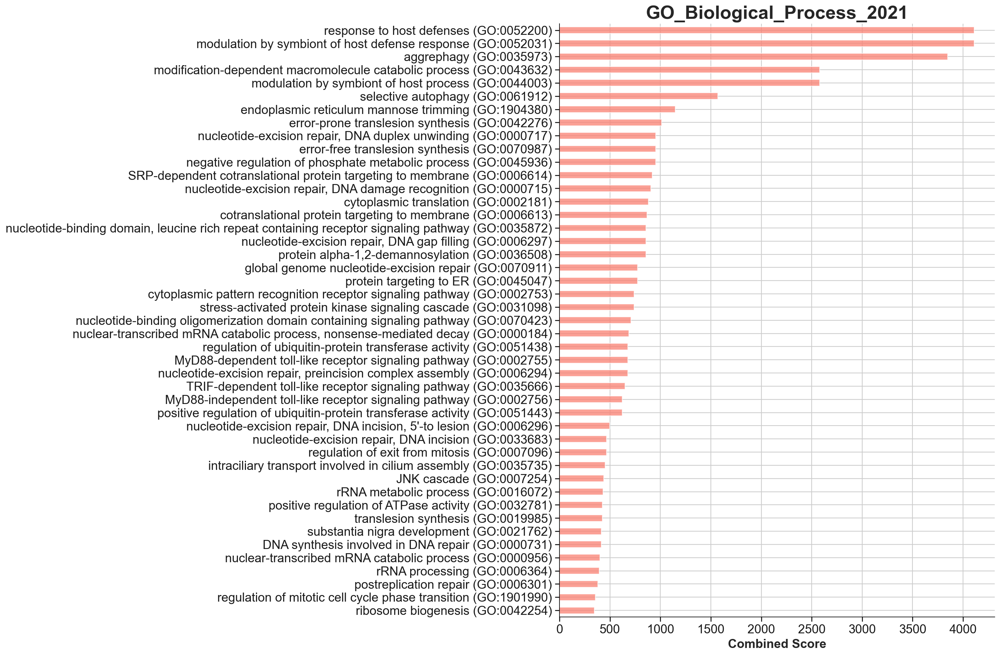

In [74]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs downregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [75]:
enr_res_11am_KEGG = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_KEGG.res2d[enr_res_11am_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_downregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(2, 10)

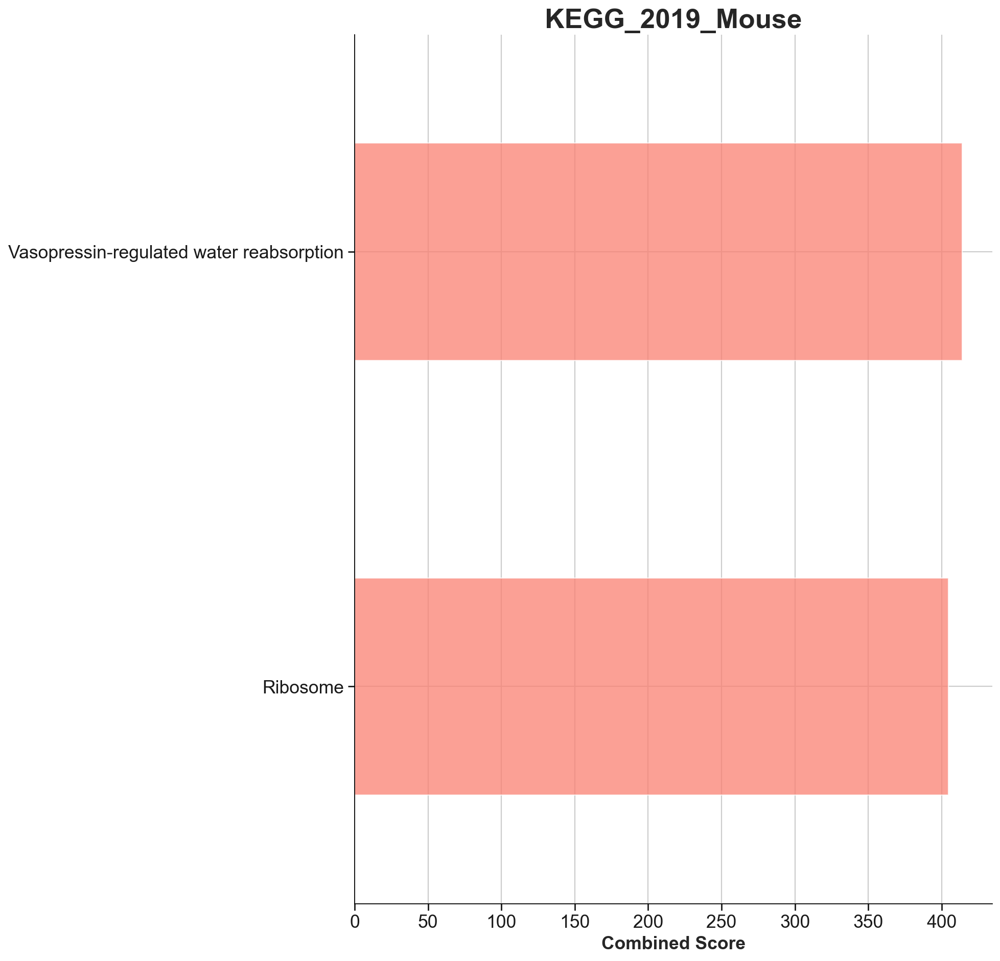

In [76]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs downregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [77]:
enr_res_11am_WIKI = gseapy.enrichr(gene_list=glist_11am, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11am_WIKI.res2d[enr_res_11am_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11am_vs_7am_downregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(2, 10)

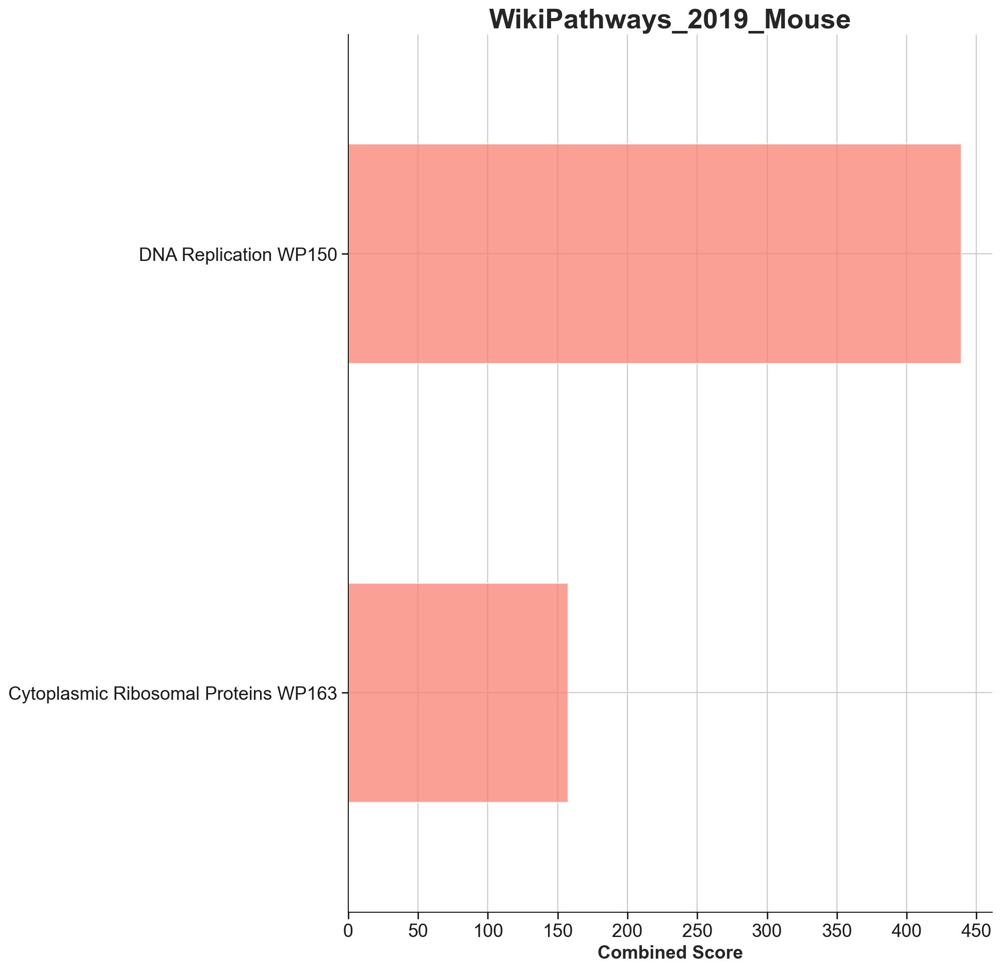

In [78]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11am vs 7am MEPs downregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [79]:
volcano_7pm_vs_11am_MEP = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=None, key='7pm_vs_11am')

In [80]:
volcano_filtered_7pm_vs_11am_MEP = volcano_7pm_vs_11am_MEP[volcano_7pm_vs_11am_MEP['pvals_adj'] < 0.05]
volcano_filtered_7pm_vs_11am_MEP.shape

(16, 5)

In [81]:
row1 = ['7pm vs 11am MEPs DEGs (p < 0.05):', volcano_filtered_7pm_vs_11am_MEP.shape[0]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [82]:
volcano_filtered_7pm_vs_11am_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_7pm_vs_11am_MEP['pvals_adj'])
volcano_filtered_7pm_vs_11am_MEP.reset_index(inplace=True, drop=True)
volcano_filtered_7pm_vs_11am_MEP.shape

/tmp/ipykernel_314409/3050186360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_filtered_7pm_vs_11am_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_7pm_vs_11am_MEP['pvals_adj'])


(16, 6)

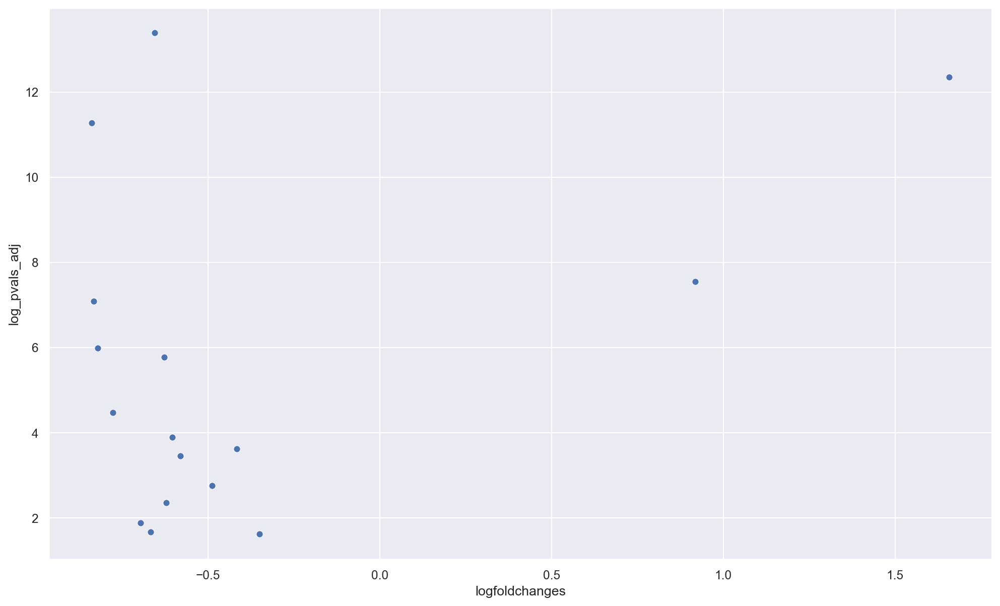

In [83]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_filtered_7pm_vs_11am_MEP, x='logfoldchanges', y= 'log_pvals_adj')
#for line in range(0,volcano_filtered_7pm_vs_11am_MEP.shape[0]):
     #plt.text(volcano_filtered_7pm_vs_11am_MEP.logfoldchanges[line], volcano_filtered_7pm_vs_11am_MEP.log_pvals_adj[line], volcano_filtered_7pm_vs_11am_MEP.names[line])
plt.savefig('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs DGEs.png')
plt.show()

In [84]:
glist_7pm = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='7pm', key='7pm_vs_11am', pval_cutoff=0.05, log2fc_min=0)['names'].squeeze().str.strip().tolist()
len(glist_7pm)

2

In [85]:
row1 = ['7pm vs 11am MEPs upregulated DEGs (p < 0.05):', len(glist_7pm)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [86]:
enr_res_7pm_process = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_process.res2d[enr_res_7pm_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_upregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(37, 10)

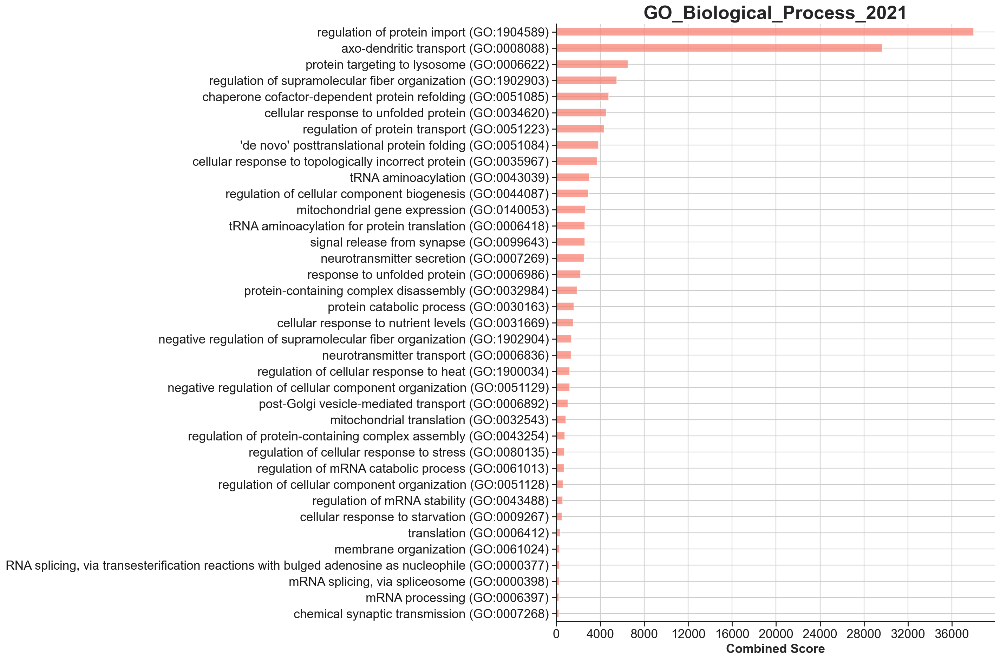

In [87]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs upregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [88]:
enr_res_7pm_KEGG = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_KEGG.res2d[enr_res_7pm_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_upregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(12, 10)

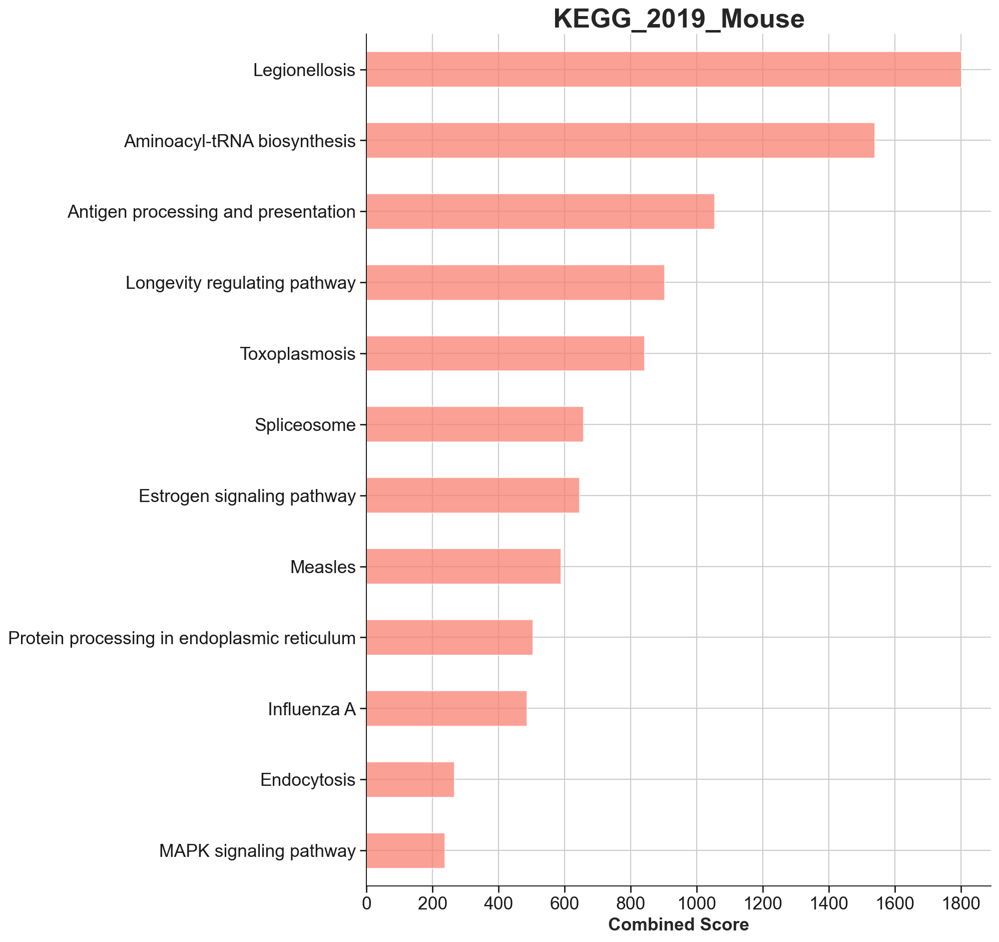

In [89]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs upregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [90]:
enr_res_7pm_WIKI = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_WIKI.res2d[enr_res_7pm_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_upregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(3, 10)

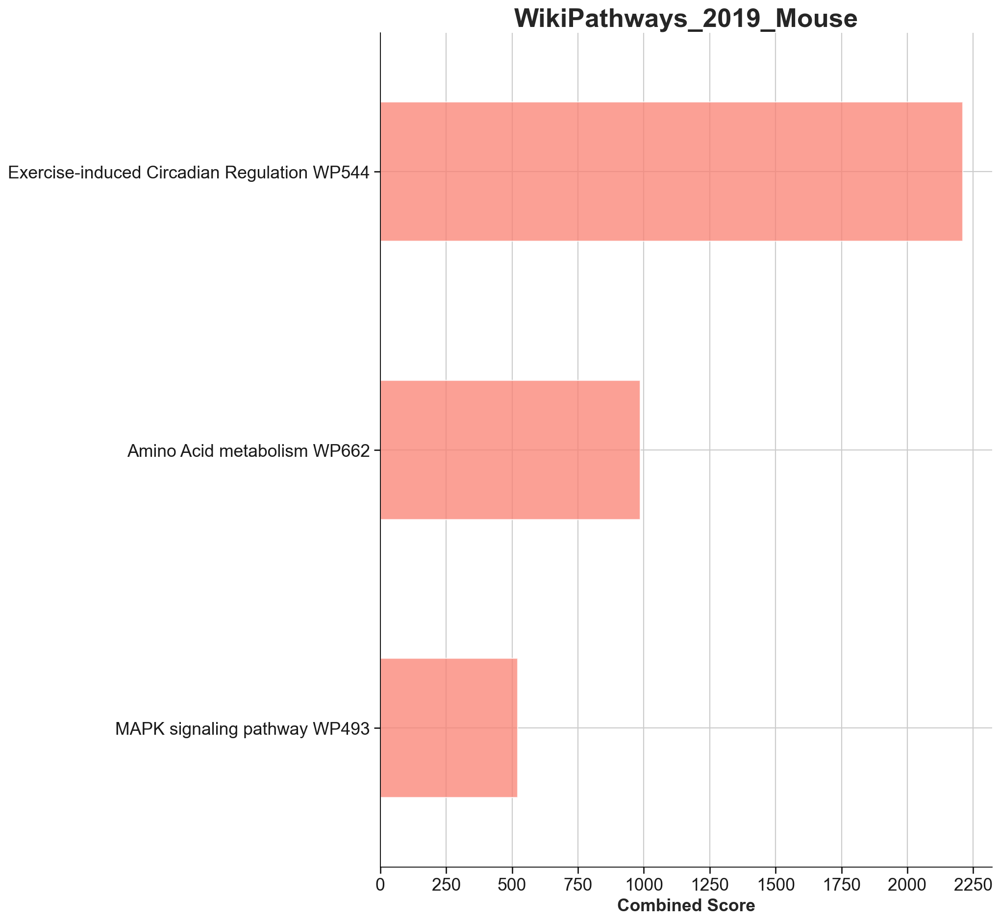

In [91]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs upregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [92]:
glist_7pm = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='7pm', key='7pm_vs_11am', pval_cutoff=0.05, log2fc_max=0)['names'].squeeze().str.strip().tolist()
len(glist_7pm)

14

In [93]:
row1 = ['7pm vs 11am MEPs downregulated DEGs (p < 0.05):', len(glist_7pm)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [94]:
enr_res_7pm_process = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_process.res2d[enr_res_7pm_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_downregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(40, 10)

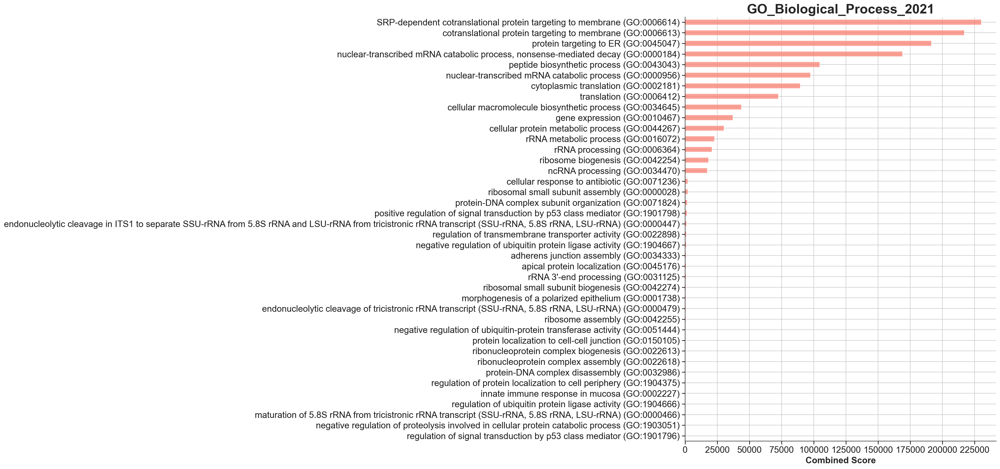

In [95]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs downregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [96]:
enr_res_7pm_KEGG = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_KEGG.res2d[enr_res_7pm_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_downregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(1, 10)

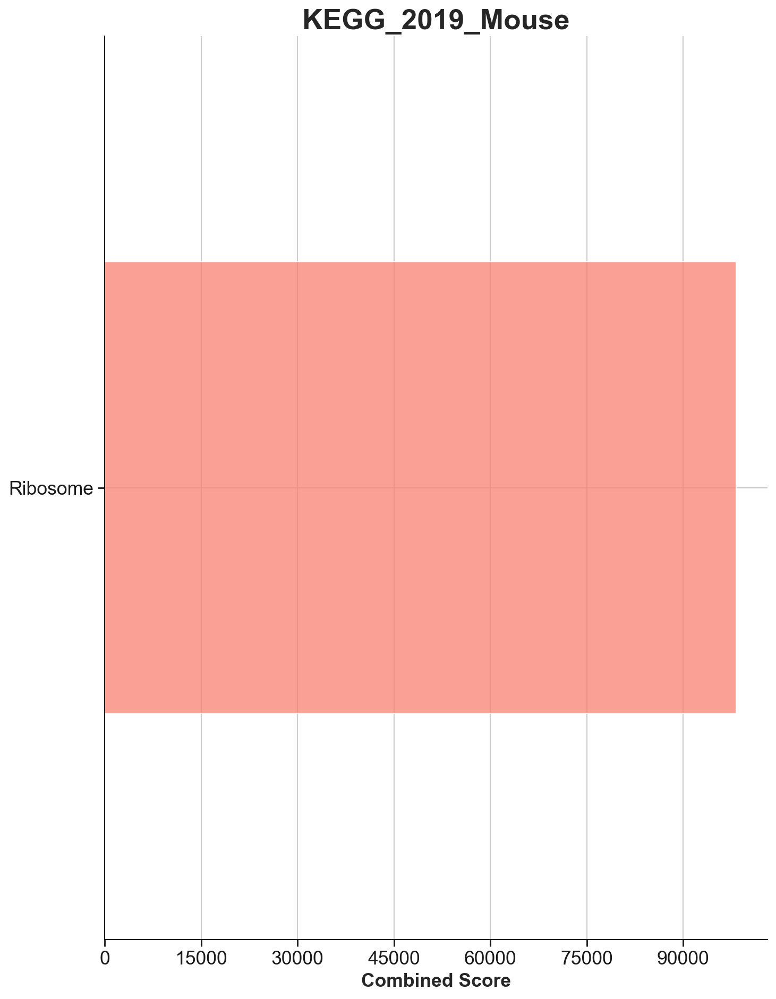

In [97]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs downregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [98]:
enr_res_7pm_WIKI = gseapy.enrichr(gene_list=glist_7pm, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_7pm_WIKI.res2d[enr_res_7pm_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_7pm_vs_11am_downregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(2, 10)

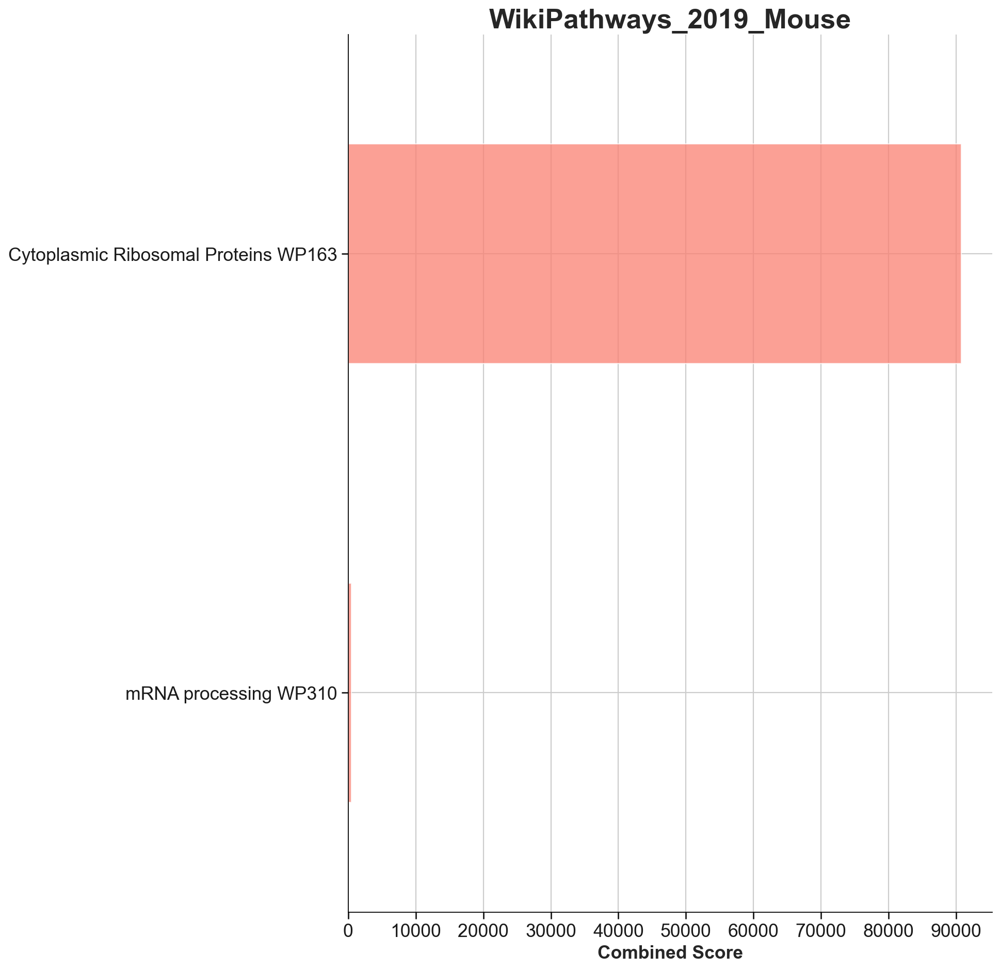

In [99]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/7pm vs 11am MEPs downregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [100]:
volcano_11pm_vs_7pm_MEP = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group=None, key='11pm_vs_7pm')

In [101]:
volcano_filtered_11pm_vs_7pm_MEP = volcano_11pm_vs_7pm_MEP[volcano_11pm_vs_7pm_MEP['pvals_adj'] < 0.05]
volcano_filtered_11pm_vs_7pm_MEP.shape

(103, 5)

In [102]:
row1 = ['11pm vs 7pm MEPs DEGs (p < 0.05):', volcano_filtered_11pm_vs_7pm_MEP.shape[0]]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [103]:
volcano_filtered_11pm_vs_7pm_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_11pm_vs_7pm_MEP['pvals_adj'])
volcano_filtered_11pm_vs_7pm_MEP.reset_index(inplace=True, drop=True)
volcano_filtered_11pm_vs_7pm_MEP.shape

/tmp/ipykernel_314409/1673089432.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_filtered_11pm_vs_7pm_MEP['log_pvals_adj'] = -np.log10(volcano_filtered_11pm_vs_7pm_MEP['pvals_adj'])


(103, 6)

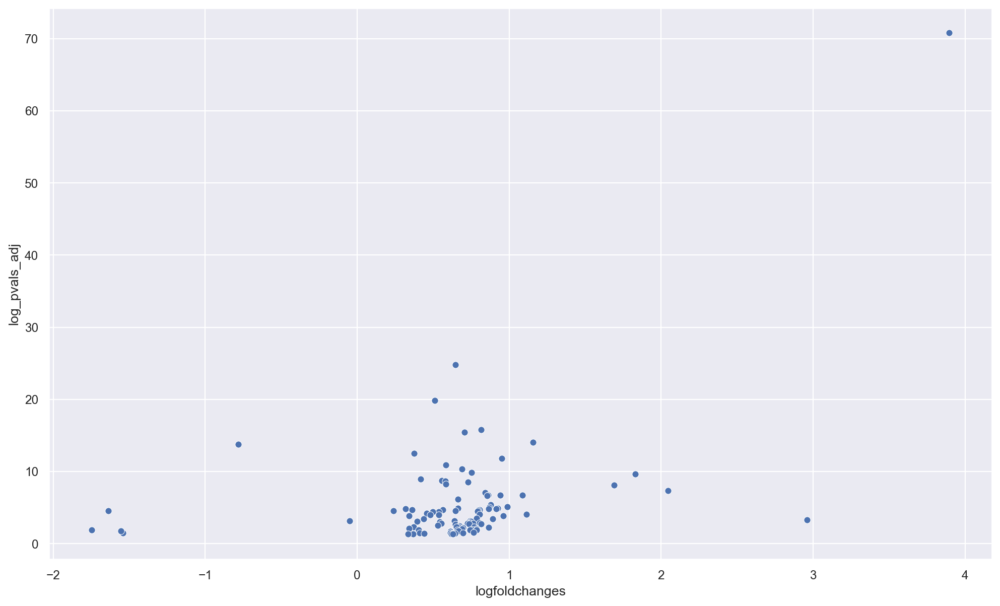

In [104]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_filtered_11pm_vs_7pm_MEP, x='logfoldchanges', y= 'log_pvals_adj')
#for line in range(0,volcano_filtered_11pm_vs_7pm_MEP.shape[0]):
     #plt.text(volcano_filtered_11pm_vs_7pm_MEP.logfoldchanges[line], volcano_filtered_11pm_vs_7pm_MEP.log_pvals_adj[line], volcano_filtered_11pm_vs_7pm_MEP.names[line])
plt.savefig('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs DGEs.png')
plt.show()

In [105]:
glist_11pm = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='11pm', key='11pm_vs_7pm', pval_cutoff=0.05, log2fc_min=0)['names'].squeeze().str.strip().tolist()
len(glist_11pm)

97

In [106]:
row1 = ['11pm vs 7pm MEPs upregulated DEGs (p < 0.05):', len(glist_11pm)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [107]:
enr_res_11pm_process = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_process.res2d[enr_res_11pm_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_upregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(53, 10)

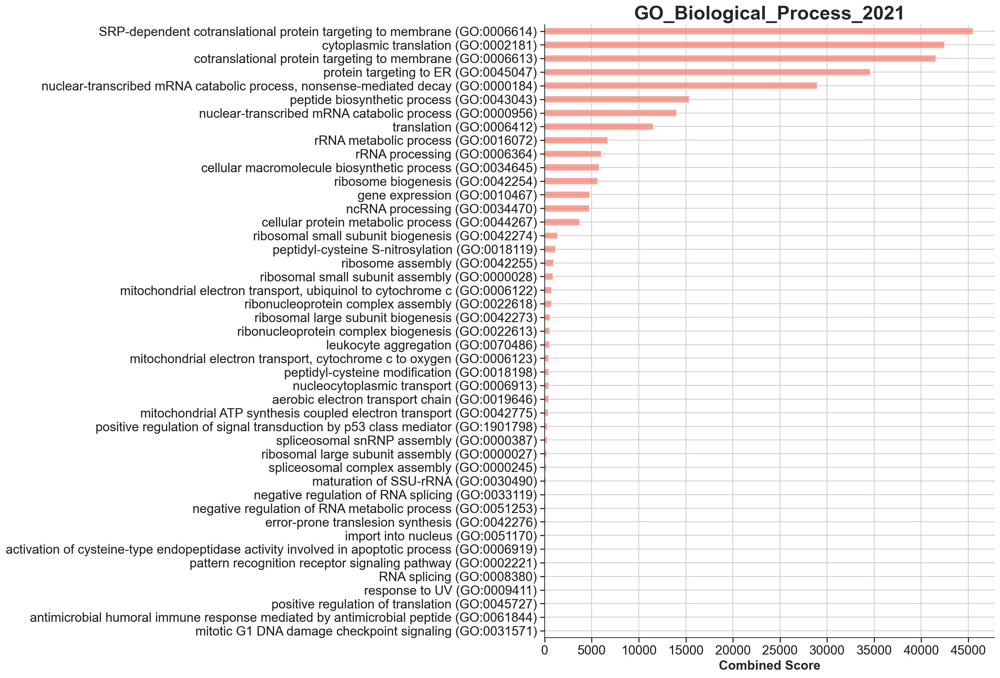

In [108]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs upregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [109]:
enr_res_11pm_KEGG = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_KEGG.res2d[enr_res_11pm_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_upregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(12, 10)

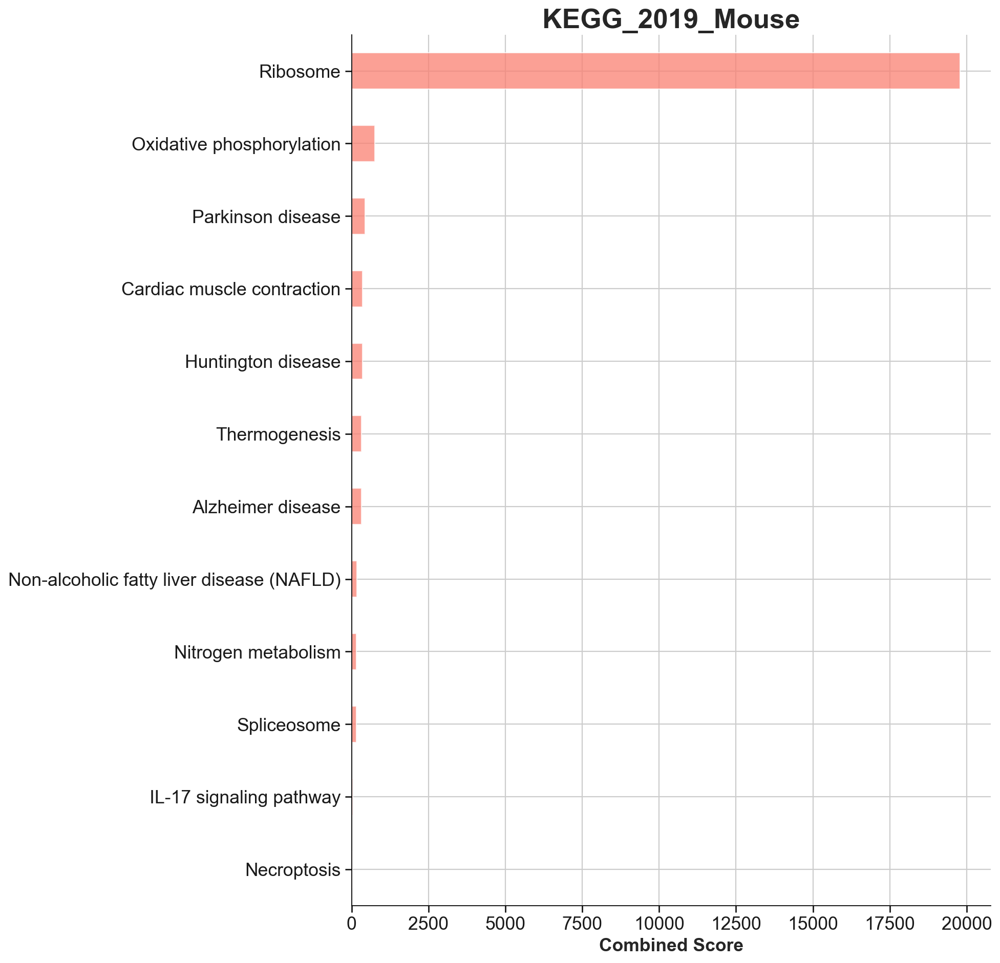

In [110]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs upregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [111]:
enr_res_11pm_WIKI = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_WIKI.res2d[enr_res_11pm_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_upregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(6, 10)

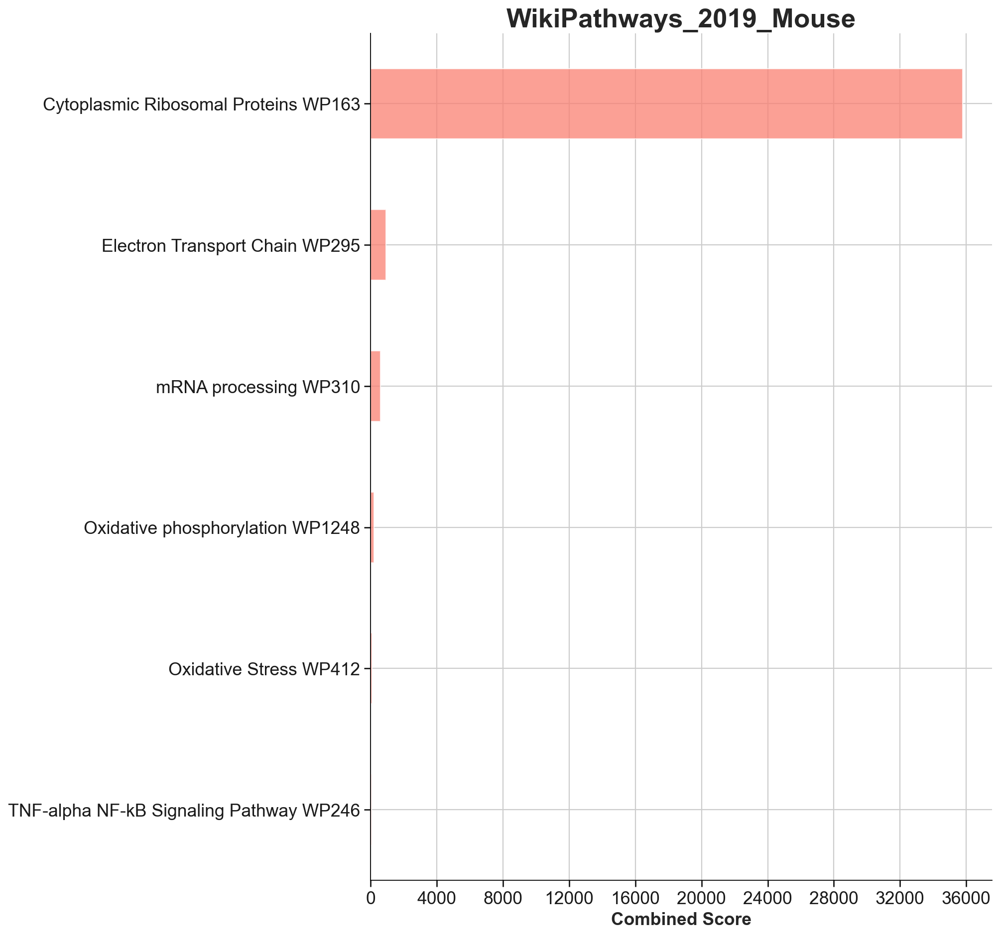

In [112]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs upregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [113]:
glist_11pm = sc.get.rank_genes_groups_df(Combined_MEP_I_UMI_II_percent, group='11pm', key='11pm_vs_7pm', pval_cutoff=0.05, log2fc_max=0)['names'].squeeze().str.strip().tolist()
len(glist_11pm)

6

In [114]:
row1 = ['11pm vs 7pm MEPs downregulated DEGs (p < 0.05):', len(glist_11pm)]
with open('/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Table_Combined_MEP_together_MNN.csv', 'a+', newline='') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=',')
      
    write.writerow(row1)

In [115]:
enr_res_11pm_process = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='GO_Biological_Process_2021', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_process.res2d[enr_res_11pm_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_downregulated_GO_BP_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(99, 10)

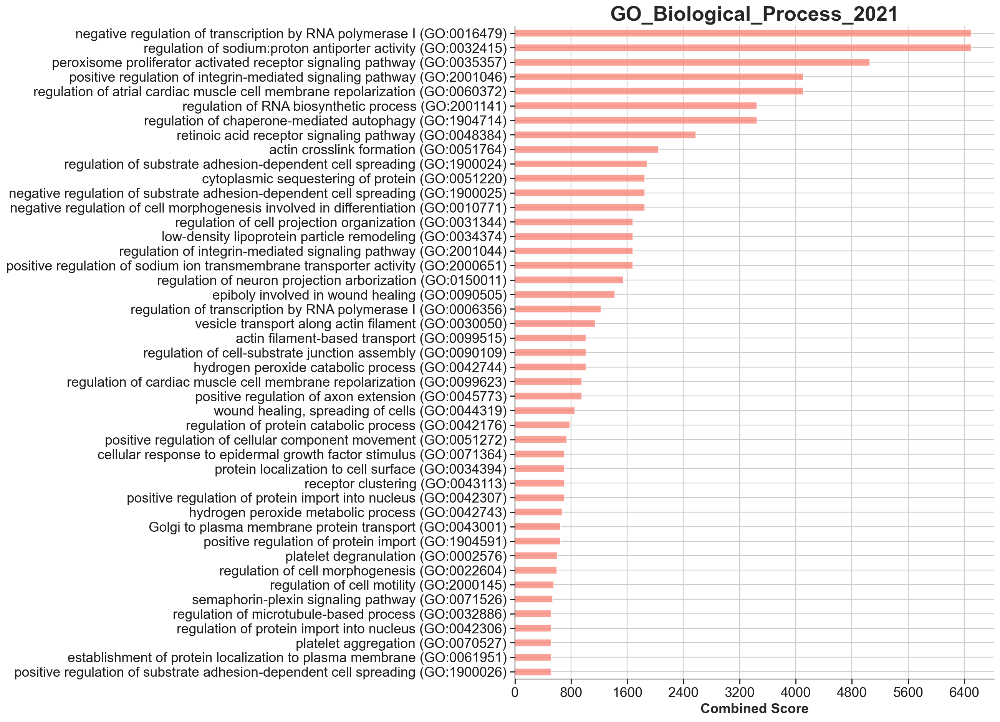

In [116]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='GO_Biological_Process_2021', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs downregulated DGE GO BP.png')

gseapy.barplot(significant_terms, title='GO_Biological_Process_2021', column='Combined Score', top_term=45, figsize=(10,14))

In [117]:
enr_res_11pm_KEGG = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='KEGG_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_KEGG.res2d[enr_res_11pm_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_downregulated_KEGG_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


(1, 10)

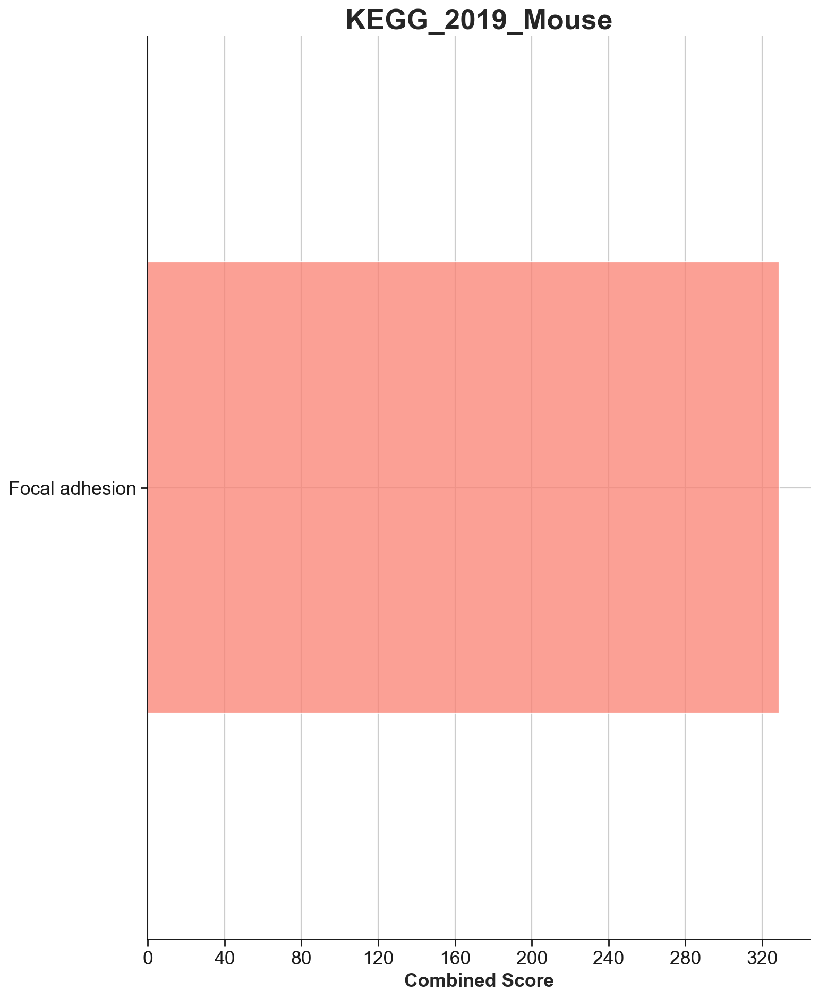

In [118]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='KEGG_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs downregulated DGE KEGG.png')

gseapy.barplot(significant_terms, title='KEGG_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

In [119]:
enr_res_11pm_WIKI = gseapy.enrichr(gene_list=glist_11pm, organism='Mouse', gene_sets='WikiPathways_2019_Mouse', description='pathway', cutoff = 0.05)
significant_terms = enr_res_11pm_WIKI.res2d[enr_res_11pm_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/Circadian/scRNA-seq/Combined/write/Uncleaned/MEP/Combined_MEP_I_UMI_II_percent_11pm_vs_7pm_downregulated_WIKI_005_together_MNN.csv")
significant_terms.shape

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-24 00:43:26,527 Warning: No enrich terms using library WikiPathways_2019_Mouse when cutoff = 0.05


(0, 10)

In [120]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=45, title='WikiPathways_2019_Mouse', figsize=(10,14), ofname='/store/Projects/pantovski/Circadian/scRNA-seq/Combined/Figures/Uncleaned/11pm vs 7pm MEPs downregulated DGE WIKI.png')

gseapy.barplot(significant_terms, title='WikiPathways_2019_Mouse', column='Combined Score', top_term=45, figsize=(10,14))

IndexError: index 0 is out of bounds for axis 0 with size 0